## Game2Movie

Original notebook from https://www.kaggle.com/balraj98/cyclegan-translating-paintings-photos-pytorch/notebook

Detecting scence changes to extract frames using: https://pyscenedetect.readthedocs.io/en/latest/

Estimating brightness of scence using: https://stackoverflow.com/questions/14243472/estimate-brightness-of-an-image-opencv

Calculating blurriness of image using: https://www.pyimagesearch.com/2015/09/07/blur-detection-with-opencv/

Scheduler with linear decay from: https://mccormickml.com/2019/07/22/BERT-fine-tuning/

Calculating FID score using: https://github.com/mseitzer/pytorch-fid

Used FaceNet version of MTCNN for face detection: https://github.com/timesler/facenet-pytorch

Adapted course code for face detection: https://colab.research.google.com/drive/1_a7Q_c_N3P_pyu3ByLcTdmKTUsO-j580?authuser=1

Used image augmentation library: https://imgaug.readthedocs.io/en/latest/index.html

Adapted data augmentation from: https://towardsdatascience.com/data-augmentation-for-deep-learning-4fe21d1a4eb9

Used to extract video clip: https://stackoverflow.com/questions/37317140/cutting-out-a-portion-of-video-python

Used practical code to load, tranform, and download video: https://colab.research.google.com/drive/1sm7S_kB_uRKsdOaVaKlUFE-VX6wwgVoI?usp=sharing

### Libraries

In [1]:
import numpy as np
import pandas as pd
import os, math, sys, re, shutil
import time, datetime
import glob, itertools
import argparse, random

import torch
import torch.nn as nn
import torch.nn.functional as F
from torchvision import datasets
from torch.autograd import Variable
from torchvision.models import vgg19
import torchvision.transforms as transforms
from torch.utils.data import DataLoader, Dataset
from torchvision.utils import save_image, make_grid

#!conda install -c conda-forge transformers
from transformers import get_linear_schedule_with_warmup

import plotly
from scipy import signal
import plotly.express as px
import plotly.graph_objects as go
import matplotlib.pyplot as plt

from PIL import Image
#!pip install IPython
from IPython import display
from tqdm import tqdm
from sklearn.model_selection import train_test_split

# !pip install scenedetect
# !pip install opencv-python
import cv2
# !pip install imgaug
from imgaug import augmenters as iaa
import ipyplot
#!pip install moviepy
from moviepy.video.io.ffmpeg_tools import ffmpeg_extract_subclip

#!pip install pytorch-fid
#!pip install facenet_pytorch
from facenet_pytorch import MTCNN

random.seed(42)
import warnings
warnings.filterwarnings("ignore")

device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
if (torch.cuda.device_count()>0):
    print(torch.cuda.get_device_name(0))

GeForce RTX 2070


## Preprocessing

In [2]:
# Estimate brightness of frame
def brightness(img):
    if len(img.shape) == 3:
        # Colored RGB or BGR (*Do Not* use HSV images with this function)
        # create brightness with euclidean norm
        return np.average(np.linalg.norm(img, axis=2)) / np.sqrt(3)
    else:
        # Grayscale
        return np.average(img)

In [3]:
# Calculate clarity of image
def variance_of_laplacian(image):
    # compute the Laplacian of the image and then return the focus
    # measure, which is simply the variance of the Laplacian
    return cv2.Laplacian(image, cv2.CV_64F).var()

In [4]:
# Ignore if already preprocessed
# Choose whether loading frames or faces
fully_loaded = True
extracted_scenes = True
use_frames = False
use_faces = True

if not fully_loaded:
    
    if not extracted_scenes:
        # Create directory for scenes
        !mkdir -p input/scenes
        %cd input/scenes

        # Get start, middle and end frames of each scene
        !scenedetect --input ../../MafiaVideogame.mp4 detect-content list-scenes save-images
        !scenedetect --input ../../TheGodfather.mp4 detect-content list-scenes save-images
        !scenedetect --input ../../TheIrishman.mp4 detect-content list-scenes save-images
        !scenedetect --input ../../TheSopranos.mp4 detect-content list-scenes save-images

        # Keep middle frames
        !rm *-01.jpg *-03.jpg

        %cd ..
        %cd ..

    basedir = 'input/scenes/'
    game_basedir = 'input/scenes/'
    movie_basedir = 'input/scenes/'
    
    if use_frames:
        
        game_frames = []
        movie_frames = []
        game_brightnesses = []
        movie_brightnesses = []
        game_clarities = []
        movie_clarities = []
        
        # Keep game frames with 30<brightness<120 and clarity>175
        res = [f for f in os.listdir(basedir) if re.search(r'(Mafia).*\.jpg$', f)]
        for f in res:
            im = np.array(Image.open(basedir+f))
            brightval = brightness(im)
            game_brightnesses.append(brightval)
            image = cv2.imread(basedir+f)
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            fm = variance_of_laplacian(gray)
            game_clarities.append(fm)
            if brightval > 30 and brightval < 120 and fm > 175:
                game_frames.append(f)

        # Keep movie frames with 30<brightness<120 and clarity>12
        res = [f for f in os.listdir(basedir) if re.search(r'(The).*\.jpg$', f)]
        for f in res:
            im = np.array(Image.open(basedir+f))
            brightval = brightness(im)
            movie_brightnesses.append(brightval)
            image = cv2.imread(basedir+f)
            gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            fm = variance_of_laplacian(gray)
            movie_clarities.append(fm)
            if brightval > 30 and brightval < 120 and fm > 12:
                movie_frames.append(f)

        # Display brightness and clarity histograms and number of frames selected
        plt.hist(game_brightnesses)
        plt.show()
        plt.hist(movie_brightnesses)
        plt.show()
        plt.hist(game_clarities)
        plt.show()
        plt.hist(movie_clarities)
        plt.show()
        print(f'Original game count: {len(game_brightnesses)} selected: {len(game_frames)}')
        print(f'Original movie count: {len(movie_brightnesses)} selected: {len(movie_frames)}')
        
    if use_faces:
        
        game_probs = []
        movie_probs = []
        
        os.makedirs("input/game2movie", exist_ok=True)
        os.makedirs("input/game2movie/game_faces", exist_ok=True)
        os.makedirs("input/game2movie/movie_faces", exist_ok=True)
        
        # Create MTCNN
        mtcnn = MTCNN(device=device, image_size=128, margin=8, selection_method='probability', min_face_size=220)
        
        # Find all faces in game frames
        res = [f for f in os.listdir(basedir) if re.search(r'(Mafia).*\.jpg$', f)]
        print(f'Original game faces: {len(res)}')
        for idx, f in enumerate(res):
            image = cv2.imread(basedir+f, cv2.IMREAD_COLOR)
            image = np.array(image)
            
            # Using MTCNN function
            image_process = cv2.cvtColor(image, cv2.COLOR_RGB2BGR) # convert to CV2's BGR to RGB for processing
            cropped_image, prob = mtcnn.forward(image_process, save_path =  f'input/game2movie/game_faces/{idx:03d}.jpg', return_prob=True)
            if prob is not None:
                game_probs.append(prob)
                if prob<0.97:
                    os.remove(f'input/game2movie/game_faces/{idx:03d}.jpg')
            
        # Find all faces in movie frames
        res = [f for f in os.listdir(basedir) if re.search(r'(The).*\.jpg$', f)]
        print(f'Original movie faces: {len(res)}')
        for idx, f in enumerate(res):
            image = cv2.imread(basedir+f, cv2.IMREAD_COLOR)
            image = np.array(image)
            
            # Using MTCNN function
            image_process = cv2.cvtColor(image, cv2.COLOR_RGB2BGR) # convert to CV2's BGR to RGB for processing
            cropped_image, prob = mtcnn.forward(image_process, save_path = f'input/game2movie/movie_faces/{idx:03d}.jpg',return_prob=True)
            if prob is not None:
                movie_probs.append(prob)
                if prob<0.97:
                    os.remove(f'input/game2movie/movie_faces/{idx:03d}.jpg')
            
        # Display probability histograms
        plt.hist(game_probs)
        plt.show()
        plt.hist(movie_probs)
        plt.show()
        
        # Extract for train-test split
        game_frames = []
        movie_frames = []
        game_brightnesses = []
        movie_brightnesses = []

        res = [f for f in os.listdir('input/game2movie/game_faces') if re.search(r'\.jpg$', f)]
        for f in res:
            im = np.array(Image.open('input/game2movie/game_faces/'+f))
            brightval = brightness(im)
            game_brightnesses.append(brightval)
            if brightval > 30 and brightval < 120: 
                game_frames.append(f)

        res = [f for f in os.listdir('input/game2movie/movie_faces') if re.search(r'\.jpg$', f)]
        for f in res:
            im = np.array(Image.open('input/game2movie/movie_faces/'+f))
            brightval = brightness(im)
            movie_brightnesses.append(brightval)
            if brightval > 30 and brightval < 120:
                movie_frames.append(f)
            
        # Display brightness histograms
        plt.hist(game_brightnesses)
        plt.show()
        plt.hist(movie_brightnesses)
        plt.show()
        
#         # Truncate set for faster performance
#         random.shuffle(game_frames)
#         game_frames = game_frames[:len(movie_frames)]
        
        print(f'Selected game faces: {len(game_frames)}')
        print(f'Selected movie faces: {len(movie_frames)}')
        
        game_basedir = 'input/game2movie/game_faces/'
        movie_basedir = 'input/game2movie/movie_faces/'
            
    # Shuffle frames
    random.shuffle(game_frames)
    random.shuffle(movie_frames)

    # Split frames into train and test sets
    train_test_split = 0.8
    split_game = int(len(game_frames)*train_test_split)
    split_movie = int(len(movie_frames)*train_test_split)

    train_game = game_frames[:split_game]
    test_game = game_frames[split_game:]

    train_movie = movie_frames[:split_movie]
    test_movie = movie_frames[split_movie:]
            

    # Save files
    os.makedirs("input/game2movie", exist_ok=True)
    os.makedirs("input/game2movie/test_game", exist_ok=True)
    os.makedirs("input/game2movie/test_movie", exist_ok=True)
    os.makedirs("input/game2movie/train_game", exist_ok=True)
    os.makedirs("input/game2movie/train_movie", exist_ok=True)

    for idx, filename in enumerate(train_game):
        shutil.copyfile(game_basedir+filename, f'input/game2movie/train_game/{idx:03d}.jpg')
    for idx, filename in enumerate(test_game):
        shutil.copyfile(game_basedir+filename, f'input/game2movie/test_game/{idx:03d}.jpg')
    for idx, filename in enumerate(train_movie):
        shutil.copyfile(movie_basedir+filename, f'input/game2movie/train_movie/{idx:03d}.jpg')    
    for idx, filename in enumerate(test_movie):
        shutil.copyfile(movie_basedir+filename, f'input/game2movie/test_movie/{idx:03d}.jpg')


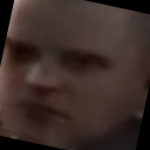
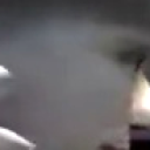
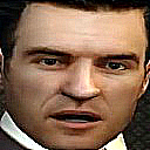
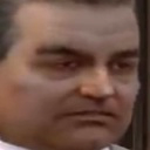
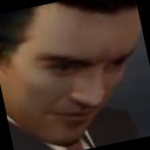
...
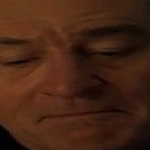
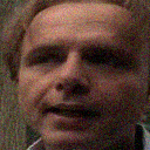
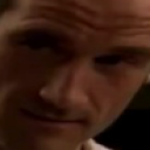
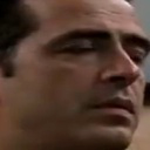
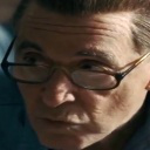

In [5]:
# choose whether to augment training data
augment = True
if augment:
    
    os.makedirs("input/game2movie/aug_train_game", exist_ok=True)
    os.makedirs("input/game2movie/aug_train_movie", exist_ok=True)

    # extract current training set
    game_images = []
    res = [f for f in os.listdir('input/game2movie/train_game') if re.search(r'\.jpg$', f)]
    for f in res:
        im = np.array(Image.open('input/game2movie/train_game/'+f))
        game_images.append(im)
        
    movie_images = []
    res = [f for f in os.listdir('input/game2movie/train_movie') if re.search(r'\.jpg$', f)]
    for f in res:
        im = np.array(Image.open('input/game2movie/train_movie/'+f))
        movie_images.append(im)
        
    # augmentation pipeline
    aug_pipeline = iaa.Sequential([
        # horizontally flip 50% of images
        iaa.Fliplr(0.5),
        # adjust brightness of images
        iaa.Multiply((0.8, 1.2)),
        # 60% of the time either zoom in or rotate image
        iaa.Sometimes(0.6,(iaa.OneOf([
            iaa.CropAndPad(percent=(-0.25, 0)),
            iaa.Rotate((-20, 20))
        ]))),
        # 30% of the time either sharpen or blur image
        iaa.Sometimes(0.3,(iaa.OneOf([
            iaa.Sharpen(alpha=(0.0, 1.0)),
            iaa.GaussianBlur(sigma=(0.0, 3.0))
        ]))),
        # 10% of time add Gaussian Noise
        iaa.Sometimes(0.10, iaa.AdditiveGaussianNoise(scale=0.05*255, per_channel=True)),
        # 20 % of time perform random erasing
        iaa.Sometimes(0.2, iaa.CoarseDropout((0.03, 0.06), size_percent=(0.02, 0.04)))
    ],
    random_order=True # apply the augmentations in random order
    )

    # generate 2x augmented versions of training data from each domain
    first_aug_game = aug_pipeline(images=game_images)
    second_aug_game = aug_pipeline(images=game_images)
    first_aug_movie = aug_pipeline(images=movie_images)
    second_aug_movie = aug_pipeline(images=movie_images)
    
    # display some augmented images
    ipyplot.plot_images(first_aug_game[:18])
    ipyplot.plot_images(first_aug_movie[:18])
    
    # add original training data
    aug_game = game_images+first_aug_game+second_aug_game
    aug_movie = movie_images+first_aug_movie+second_aug_movie
    
    # shuffle frames
    random.shuffle(aug_game)
    random.shuffle(aug_movie)

    # save new training sets
    for idx, im in enumerate(aug_game):
        im = Image.fromarray(im, 'RGB')
        im.save(f'input/game2movie/aug_train_game/{idx:03d}.jpg')
        
    for idx, im in enumerate(aug_movie):
        im = Image.fromarray(im, 'RGB')
        im.save(f'input/game2movie/aug_train_movie/{idx:03d}.jpg')

## CycleGAN

### Settings

In [6]:
dataset = 'game2movie'
# path to pre-trained models
pretrained_model_path = f"./saved_models/{dataset}"
# path to input
dataset_path = f"./input/{dataset}"
# path to output
output_path = f"./output/{dataset}"
# whether or not to use pretrained model
pretrained = False
# number of training epochs
n_epochs = 33
# size of the batches
batch_size = 2
# adam parameters: learning rate and decay of moments
lr = 0.0002
b1 = 0.5
b2 = 0.999
# number of cpu threads to use during batch generation
n_workers = 8
# size of image height
img_height = 128
# size of image width
img_width = 128
# number of image channels
channels = 3
# number of residual blocks in generator
n_residual_blocks = 6
# cycle loss weight
lambda_cyc = 10.0
# identity loss weight
lambda_id = lambda_cyc/2
# test image input shape
test_shape = [720,1280]
# test image target width
test_width = 512

# Create images and checkpoint directories
os.makedirs(pretrained_model_path, exist_ok=True)
os.makedirs(output_path, exist_ok=True)

### Define Utilities

In [7]:
# Buffer of previously generated samples 
# (don't generate fresh images for the discriminator each time)
class ReplayBuffer:
    def __init__(self, max_size=50):
        assert max_size > 0, "Empty buffer or trying to create a black hole. Be careful."
        self.max_size = max_size
        self.data = []

    def push_and_pop(self, data):
        to_return = []
        for element in data.data:
            element = torch.unsqueeze(element, 0)
            if len(self.data) < self.max_size:
                self.data.append(element)
                to_return.append(element)
            else:
                if random.uniform(0, 1) > 0.5:
                    i = random.randint(0, self.max_size - 1)
                    to_return.append(self.data[i].clone())
                    self.data[i] = element
                else:
                    to_return.append(element)
        return Variable(torch.cat(to_return))


### Define Dataset Class

In [8]:
# Define datatset of frames
class ImageDataset(Dataset):
    def __init__(self, root, transforms_=None, mode="train"):
        # Initialise transforms and files
        self.transform = transforms.Compose(transforms_)
        if augment and mode=="train":
            self.files_game = sorted(glob.glob(os.path.join(root, f"aug_train_game") + "/*.*"))
            self.files_movie = sorted(glob.glob(os.path.join(root, f"aug_train_movie") + "/*.*"))
        else:
            self.files_game = sorted(glob.glob(os.path.join(root, f"{mode}_game") + "/*.*"))
            self.files_movie = sorted(glob.glob(os.path.join(root, f"{mode}_movie") + "/*.*"))

    def __getitem__(self, index):
        # Apply transforms to frames
        image_game = Image.open(self.files_game[index % len(self.files_game)])
        image_movie = Image.open(self.files_movie[random.randint(0, len(self.files_movie) - 1)])

        item_game = self.transform(image_game)
        item_movie = self.transform(image_movie)
        return {"Game": item_game, "Movie": item_movie}

    def __len__(self):
        return max(len(self.files_game), len(self.files_movie))

### Get Train/Test Dataloaders

In [9]:
# Image transformations
train_transforms_ = [
    # resize so larger random crop taken
    transforms.Resize((256)),
    transforms.RandomCrop((img_height, img_width)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
]

test_transforms_ = [
    transforms.Resize((int(test_width*(test_shape[0]/test_shape[1])),test_width)),
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5)),
]

if use_faces:
    train_transforms_ = [
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ]
    test_transforms_ = [
        transforms.ToTensor(),
        transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
    ]

# Training data loader
train_dataloader = DataLoader(
    ImageDataset(f"{dataset_path}", transforms_=train_transforms_),
    batch_size=batch_size,
    shuffle=True,
    num_workers=n_workers,
)
# Test data loader
test_dataloader = DataLoader(
    ImageDataset(f"{dataset_path}", transforms_=test_transforms_, mode="test"),
    batch_size=1,
    shuffle=True,
    num_workers=1,
)

<h3><center>Model Architecture</center></h3>
<img src="https://miro.medium.com/max/700/1*_KxtJIVtZjVaxxl-Yl1vJg.png" width="900" height="900"/>
<h4></h4>
<h4><center>Image Source:  <a href="https://arxiv.org/pdf/1703.10593.pdf">Unpaired Image-to-Image Translation using Cycle-Consistent Adversarial Networks [C. Jun-Yan Zhu et al.]</a></center></h4>

### Define Model Classes

In [10]:
def weights_init_normal(m):
    # initialise weights according to Gaussian distribution defined in CycleGAN paper
    classname = m.__class__.__name__
    if classname.find("Conv") != -1:
        torch.nn.init.normal_(m.weight.data, 0.0, 0.02)
        if hasattr(m, "bias") and m.bias is not None:
            torch.nn.init.constant_(m.bias.data, 0.0)
    elif classname.find("BatchNorm2d") != -1:
        torch.nn.init.normal_(m.weight.data, 1.0, 0.02)
        torch.nn.init.constant_(m.bias.data, 0.0)

# Residual blocks used in generator (allow flow of info. from initial to final layers)
class ResidualBlock(nn.Module):
    def __init__(self, in_features):
        super(ResidualBlock, self).__init__()

        self.block = nn.Sequential(
            # Reflection padding to reduce artifacts
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, 3),
            nn.InstanceNorm2d(in_features),
            nn.ReLU(inplace=True),
            nn.ReflectionPad2d(1),
            nn.Conv2d(in_features, in_features, 3),
            nn.InstanceNorm2d(in_features),
        )

    def forward(self, x):
        return x + self.block(x)


class GeneratorResNet(nn.Module):
    def __init__(self, input_shape, num_residual_blocks):
        super(GeneratorResNet, self).__init__()

        channels = input_shape[0]

        # Initial convolution block
        out_features = 64
        model = [
            nn.ReflectionPad2d(channels),
            nn.Conv2d(channels, out_features, 7),
            nn.InstanceNorm2d(out_features),
            nn.ReLU(inplace=True),
        ]
        in_features = out_features

        # Downsampling
        for _ in range(2):
            out_features *= 2
            model += [
                nn.Conv2d(in_features, out_features, 3, stride=2, padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True),
            ]
            in_features = out_features

        # Residual blocks
        for _ in range(num_residual_blocks):
            model += [ResidualBlock(out_features)]

        # Upsampling
        for _ in range(2):
            out_features //= 2
            model += [
                nn.ConvTranspose2d(in_features, out_features, 3, stride=2, padding=1, output_padding=1),
                nn.InstanceNorm2d(out_features),
                nn.ReLU(inplace=True),
            ]
            in_features = out_features

        # Output layer
        model += [nn.ReflectionPad2d(channels), nn.Conv2d(out_features, channels, 7), nn.Tanh()]

        self.model = nn.Sequential(*model)

    def forward(self, x):
        return self.model(x)


class Discriminator(nn.Module):
    def __init__(self, input_shape):
        super(Discriminator, self).__init__()

        channels, height, width = input_shape

        # Calculate output shape of image discriminator (PatchGAN)
        self.output_shape = (1, height // 2 ** 4, width // 2 ** 4)

        def discriminator_block(in_filters, out_filters, normalize=True):
            """Returns downsampling layers of each discriminator block"""
            layers = [nn.Conv2d(in_filters, out_filters, 4, stride=2, padding=1)]
            if normalize:
                layers.append(nn.InstanceNorm2d(out_filters))
            layers.append(nn.LeakyReLU(0.2, inplace=True))
            return layers

        self.model = nn.Sequential(
            *discriminator_block(channels, 64, normalize=False),
            *discriminator_block(64, 128),
            *discriminator_block(128, 256),
            *discriminator_block(256, 512),
            nn.ZeroPad2d((1, 0, 1, 0)),
            nn.Conv2d(512, 1, 4, padding=1)
        )

    def forward(self, img):
        return self.model(img)

### Train CycleGAN

In [11]:
# Losses
criterion_GAN = torch.nn.MSELoss()
criterion_cycle = torch.nn.L1Loss()
criterion_identity = torch.nn.L1Loss()

cuda = torch.cuda.is_available()

input_shape = (channels, img_height, img_width)

# Initialize generator and discriminator
G_AB = GeneratorResNet(input_shape, n_residual_blocks)
G_BA = GeneratorResNet(input_shape, n_residual_blocks)
D_A = Discriminator(input_shape)
D_B = Discriminator(input_shape)

Tensor = torch.cuda.FloatTensor if cuda else torch.Tensor

os.makedirs(output_path+'/real_game', exist_ok=True)
os.makedirs(output_path+'/fake_game', exist_ok=True)
os.makedirs(output_path+'/real_movie', exist_ok=True)
os.makedirs(output_path+'/fake_movie', exist_ok=True)
os.makedirs(output_path+'/all', exist_ok=True)

if cuda:
    G_AB = G_AB.cuda()
    G_BA = G_BA.cuda()
    D_A = D_A.cuda()
    D_B = D_B.cuda()
    criterion_GAN.cuda()
    criterion_cycle.cuda()
    criterion_identity.cuda()

if pretrained:
    # Load pretrained models
    G_AB.load_state_dict(torch.load(f"{pretrained_model_path}/G_AB.pth"))
    G_BA.load_state_dict(torch.load(f"{pretrained_model_path}/G_BA.pth"))
    D_A.load_state_dict(torch.load(f"{pretrained_model_path}/D_A.pth"))
    D_B.load_state_dict(torch.load(f"{pretrained_model_path}/D_B.pth"))
    
    for batch_idx, batch in enumerate(test_dataloader):
        
        real_A = Variable(batch["Game"].type(Tensor))
        real_B = Variable(batch["Movie"].type(Tensor))

        G_AB.eval()
        G_BA.eval()
        fake_B = G_AB(real_A)
        fake_A = G_BA(real_B)
        
        # Save images
        save_image(real_A, f"{output_path}/real_game/{batch_idx}.png", normalize=True)
        save_image(fake_B, f"{output_path}/fake_movie/{batch_idx}.png", normalize=True)
        save_image(real_B, f"{output_path}/real_movie/{batch_idx}.png", normalize=True)
        save_image(fake_A, f"{output_path}/fake_game/{batch_idx}.png", normalize=True)
        # Arrange images along x-axis
        real_A = make_grid(real_A, nrow=1, normalize=True)
        real_B = make_grid(real_B, nrow=1, normalize=True)
        fake_A = make_grid(fake_A, nrow=1, normalize=True)
        fake_B = make_grid(fake_B, nrow=1, normalize=True)
        # Arrange images along y-axis
        image_grid = torch.cat((real_A, fake_B, real_B, fake_A), -1)
        # Save images
        save_image(image_grid, f"{output_path}/all/{batch_idx}.png", normalize=False)
else:
    # Initialize weights
    G_AB.apply(weights_init_normal)
    G_BA.apply(weights_init_normal)
    D_A.apply(weights_init_normal)
    D_B.apply(weights_init_normal)

    # Optimizers
    optimizer_G = torch.optim.Adam(
        itertools.chain(G_AB.parameters(), G_BA.parameters()), lr=lr, betas=(b1, b2)
    )
    optimizer_D_A = torch.optim.Adam(D_A.parameters(), lr=lr/2, betas=(b1, b2))
    optimizer_D_B = torch.optim.Adam(D_B.parameters(), lr=lr/2, betas=(b1, b2))

    # Linearly decay learning rate after n_epochs/2 steps
    # total_steps = len(train_dataloader)*int(round(n_epochs/2))

    # scheduler_G = get_linear_schedule_with_warmup(optimizer_G, num_warmup_steps=0, num_training_steps=total_steps)
    # scheduler_D_A = get_linear_schedule_with_warmup(optimizer_D_A, num_warmup_steps=0, num_training_steps=total_steps)
    # scheduler_D_B = get_linear_schedule_with_warmup(optimizer_D_B, num_warmup_steps=0, num_training_steps=total_steps)

    # Buffers of previously generated samples
    fake_A_buffer = ReplayBuffer()
    fake_B_buffer = ReplayBuffer()

    train_counter = []
    train_losses_gen, train_losses_id_A, train_losses_id_B, train_losses_gan_AB, train_losses_gan_BA, train_losses_cyc_A, train_losses_cyc_B, = [], [], [], [], [], [], []
    train_losses_disc_a, train_losses_disc_b = [], []
    test_losses_gen = []

In [12]:
if not pretrained:
    
    start = time.time()

    for epoch in range(n_epochs):

        #### Training
        loss_gen = loss_identity_A = loss_identity_B = loss_gan_AB = loss_gan_BA = loss_cyc_A = loss_cyc_B = 0.0
        loss_disc_a = loss_disc_b = 0.0
        tqdm_bar = tqdm(train_dataloader, desc=f'Training Epoch {epoch} ', total=int(len(train_dataloader)),miniters=1,mininterval=0)
        for batch_idx, batch in enumerate(tqdm_bar):

            # Set model input
            real_A = Variable(batch["Game"].type(Tensor))
            real_B = Variable(batch["Movie"].type(Tensor))
            # Adversarial ground truths
            valid = Variable(Tensor(np.ones((real_A.size(0), *D_A.output_shape))), requires_grad=False)
            fake = Variable(Tensor(np.zeros((real_A.size(0), *D_A.output_shape))), requires_grad=False)

            ### Train Generators
            G_AB.train()
            G_BA.train()
            optimizer_G.zero_grad()
            # Identity loss
            loss_id_A = criterion_identity(G_BA(real_A), real_A)
            loss_id_B = criterion_identity(G_AB(real_B), real_B)
            # GAN loss
            fake_B = G_AB(real_A)
            loss_GAN_AB = criterion_GAN(D_B(fake_B), valid)
            fake_A = G_BA(real_B)
            loss_GAN_BA = criterion_GAN(D_A(fake_A), valid)
            # Cycle loss
            recov_A = G_BA(fake_B)
            loss_cycle_A = criterion_cycle(recov_A, real_A)
            recov_B = G_AB(fake_A)
            loss_cycle_B = criterion_cycle(recov_B, real_B)
            # Total loss
            loss_G = lambda_id * (loss_id_A + loss_id_B) + loss_GAN_AB + loss_GAN_BA + lambda_cyc * (loss_cycle_A + loss_cycle_B)
            loss_G.backward()
            optimizer_G.step()
            # Linear decay of learning rate after n_epochs/2
    #         if epoch >= int(round(n_epochs/2)):
    #             scheduler_G.step()

            ### Train Discriminator-A
            D_A.train()
            optimizer_D_A.zero_grad()
            # Real loss
            loss_real = criterion_GAN(D_A(real_A), valid)
            # Fake loss (on batch of previously generated samples)
            fake_A_ = fake_A_buffer.push_and_pop(fake_A)
            loss_fake = criterion_GAN(D_A(fake_A_.detach()), fake)
            # Total loss
            loss_D_A = (loss_real + loss_fake) / 2
            loss_D_A.backward()
            optimizer_D_A.step()
    #         if epoch >= int(round(n_epochs/2)):
    #             scheduler_D_A.step()

            ### Train Discriminator-B
            D_B.train()
            optimizer_D_B.zero_grad()
            # Real loss
            loss_real = criterion_GAN(D_B(real_B), valid)
            # Fake loss (on batch of previously generated samples)
            fake_B_ = fake_B_buffer.push_and_pop(fake_B)
            loss_fake = criterion_GAN(D_B(fake_B_.detach()), fake)
            # Total loss
            loss_D_B = (loss_real + loss_fake) / 2
            loss_D_B.backward()
            optimizer_D_B.step()
    #         if epoch >= int(round(n_epochs/2)):
    #             scheduler_D_B.step()

            ### Log Progress
            loss_gen += loss_G.item(); loss_identity_A += loss_id_A.item(); loss_identity_B += loss_id_B.item(); loss_gan_AB += loss_GAN_AB.item(); loss_gan_BA += loss_GAN_BA.item(); loss_cyc_A += loss_cycle_A.item(); loss_cyc_B += loss_cycle_B.item()
            loss_disc_a += loss_D_A.item(); loss_disc_b += loss_D_B.item()
            tqdm_bar.set_postfix(Gen_loss=loss_gen/(batch_idx+1),DiscA_loss = loss_disc_a/(batch_idx+1),DiscB_loss = loss_disc_b/(batch_idx+1))

        train_counter.append(epoch+1)
        train_losses_gen.append(loss_gen); train_losses_id_A.append(loss_identity_A); train_losses_id_B.append(loss_identity_B); train_losses_gan_AB.append(loss_gan_AB); train_losses_gan_BA.append(loss_gan_BA); train_losses_cyc_A.append(loss_cyc_A); train_losses_cyc_B.append(loss_cyc_B)
        train_losses_disc_a.append(loss_disc_a); train_losses_disc_b.append(loss_disc_b)

        #### Testing
        loss_gen = 0.0
        tqdm_bar = tqdm(test_dataloader, desc=f'Testing Epoch {epoch} ', total=int(len(test_dataloader)),miniters=1,mininterval=0)
        for batch_idx, batch in enumerate(tqdm_bar):

            # Set model input
            real_A = Variable(batch["Game"].type(Tensor))
            real_B = Variable(batch["Movie"].type(Tensor))

            ### Test Generators
            G_AB.eval()
            G_BA.eval()
            # Identity loss
            loss_id_A = criterion_identity(G_BA(real_A), real_A)
            loss_id_B = criterion_identity(G_AB(real_B), real_B)
            # GAN loss
            fake_B = G_AB(real_A)
            loss_GAN_AB = criterion_GAN(D_B(fake_B), valid)
            fake_A = G_BA(real_B)
            loss_GAN_BA = criterion_GAN(D_A(fake_A), valid)
            # Cycle loss
            recov_A = G_BA(fake_B)
            loss_cycle_A = criterion_cycle(recov_A, real_A)
            recov_B = G_AB(fake_A)
            loss_cycle_B = criterion_cycle(recov_B, real_B)
            # Total loss
            loss_G = lambda_id * (loss_id_A + loss_id_B) + loss_GAN_AB + loss_GAN_BA + lambda_cyc * (loss_cycle_A + loss_cycle_B)

            loss_gen += loss_G.item();

            # Save images
            save_image(real_A, f"{output_path}/real_game/{batch_idx}.png", normalize=True)
            save_image(fake_B, f"{output_path}/fake_movie/{batch_idx}.png", normalize=True)
            save_image(real_B, f"{output_path}/real_movie/{batch_idx}.png", normalize=True)
            save_image(fake_A, f"{output_path}/fake_game/{batch_idx}.png", normalize=True)
            # Arrange images along x-axis
            real_A = make_grid(real_A, nrow=1, normalize=True)
            real_B = make_grid(real_B, nrow=1, normalize=True)
            fake_A = make_grid(fake_A, nrow=1, normalize=True)
            fake_B = make_grid(fake_B, nrow=1, normalize=True)
            # Arrange images along y-axis
            image_grid = torch.cat((real_A, fake_B, real_B, fake_A), -1)
            # Save images
            save_image(image_grid, f"{output_path}/all/{batch_idx}.png", normalize=False)

        test_losses_gen.append(loss_gen)

        # Save model checkpoints for model with minimal loss
        if np.argmin(test_losses_gen) == len(test_losses_gen)-1:
            # Save model checkpoints
            torch.save(G_AB.state_dict(), f"{pretrained_model_path}/G_AB.pth")
            torch.save(G_BA.state_dict(), f"{pretrained_model_path}/G_BA.pth")
            torch.save(D_A.state_dict(), f"{pretrained_model_path}/D_A.pth")
            torch.save(D_B.state_dict(), f"{pretrained_model_path}/D_B.pth")


    end = time.time()
    print("Time taken:",str(datetime.timedelta(seconds = int(round(end-start)))))


Training Epoch 2 :  39%|███▉      | 590/1494 [01:45<02:40,  5.65it/s, DiscA_loss=0.189, DiscB_loss=0.197, Gen_loss=5.31]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training Epoch 5 :  56%|█████▌    | 838/1494 [02:29<01:56,  5.62it/s, DiscA_loss=0.154, DiscB_loss=0.124, Gen_loss=5.04]IOPub message rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_msg_rate_limit`.

Current values:
NotebookApp.iopub_msg_rate_limit=1000.0 (msgs/sec)
NotebookApp.rate_limit_window=3.0 (secs)

Training Epoch 8 :  82%|████████▏ | 1227/1494 [03:38<00:47,  5.63it/s, DiscA_loss=0.132, DiscB_loss=0.145, Gen

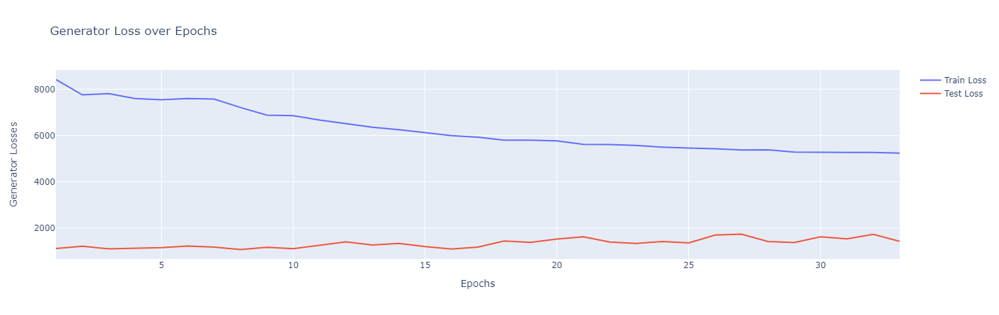

In [13]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train_counter, y=train_losses_gen, mode='lines', name='Train Loss'))
fig.add_trace(go.Scatter(x=train_counter, y=test_losses_gen, mode='lines', name='Test Loss'))

fig.update_layout(
    title="Generator Loss over Epochs",
    xaxis_title="Epochs",
    yaxis_title="Generator Losses"),
fig.show()

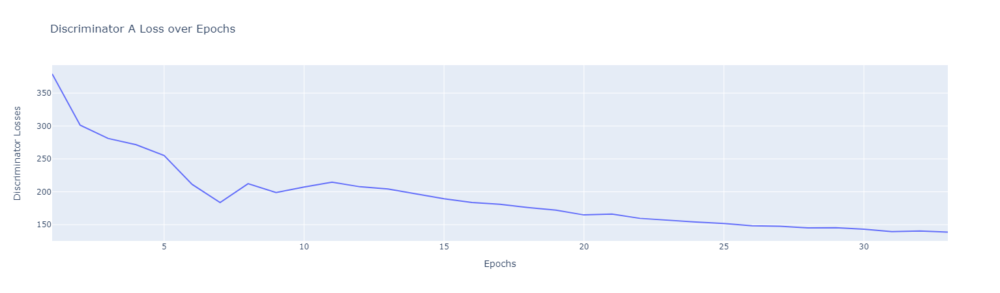

In [14]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train_counter, y=train_losses_disc_a, mode='lines', name='Discriminator A Loss'))

fig.update_layout(
    title="Discriminator A Loss over Epochs",
    xaxis_title="Epochs",
    yaxis_title="Discriminator Losses"),
fig.show()

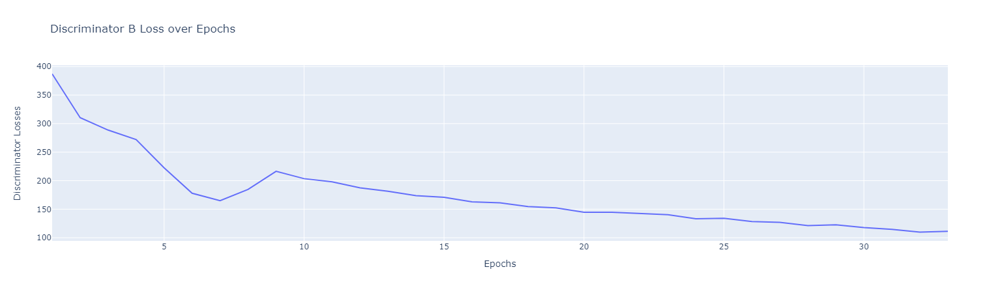

In [15]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train_counter, y=train_losses_disc_b, mode='lines', name='Discriminator B Loss'))

fig.update_layout(
    title="Discriminator B Loss over Epochs",
    xaxis_title="Epochs",
    yaxis_title="Discriminator Losses"),
fig.show()

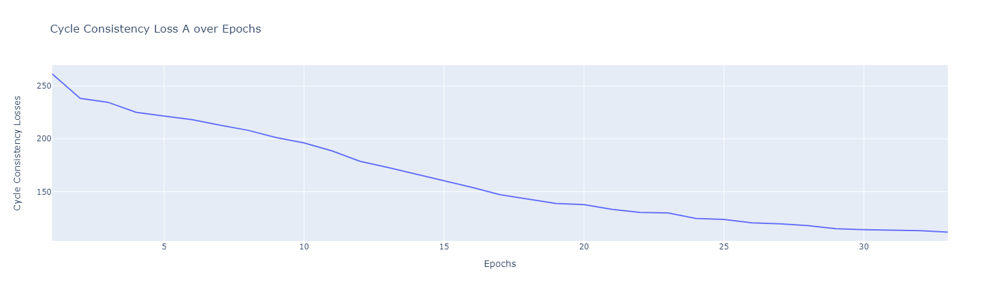

In [16]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train_counter, y=train_losses_cyc_A, mode='lines', name='Cycle Consistency Loss A'))

fig.update_layout(
    title="Cycle Consistency Loss A over Epochs",
    xaxis_title="Epochs",
    yaxis_title="Cycle Consistency Losses"),
fig.show()

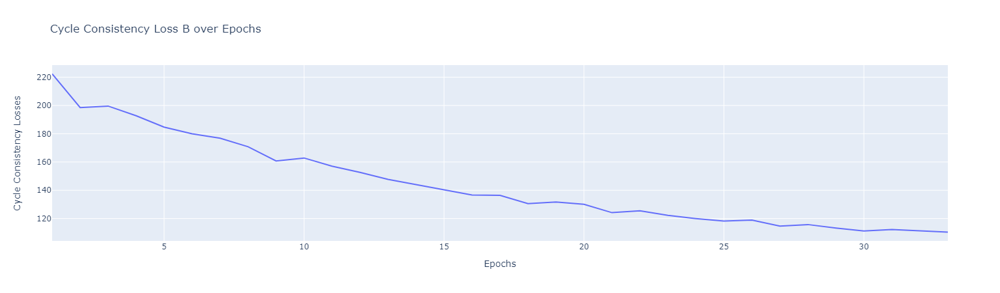

In [17]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train_counter, y=train_losses_cyc_B, mode='lines', name='Cycle Consistency Loss B'))

fig.update_layout(
    title="Cycle Consistency Loss B over Epochs",
    xaxis_title="Epochs",
    yaxis_title="Cycle Consistency Losses"),
fig.show()

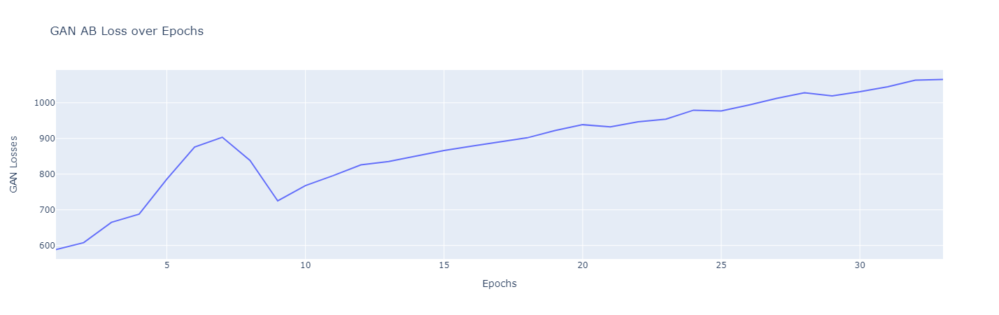

In [18]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train_counter, y=train_losses_gan_AB, mode='lines', name='GAN AB Loss'))

fig.update_layout(
    title="GAN AB Loss over Epochs",
    xaxis_title="Epochs",
    yaxis_title="GAN Losses"),
fig.show()

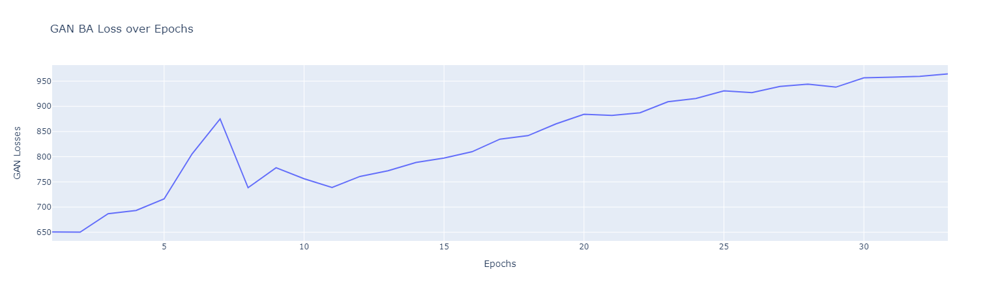

In [19]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train_counter, y=train_losses_gan_BA, mode='lines', name='GAN BA Loss'))

fig.update_layout(
    title="GAN BA Loss over Epochs",
    xaxis_title="Epochs",
    yaxis_title="GAN Losses"),
fig.show()

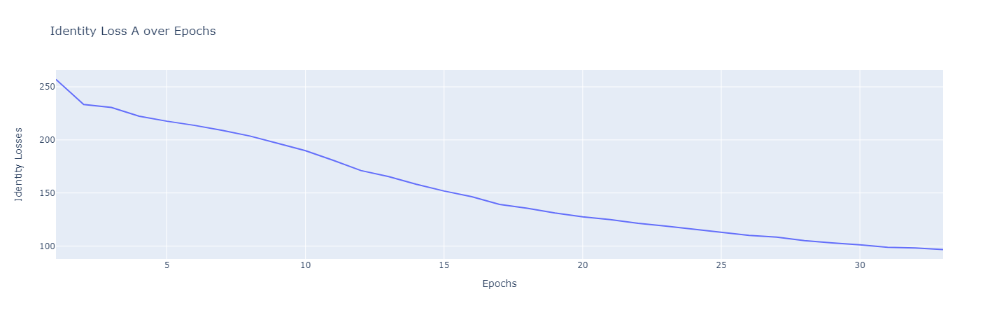

In [20]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train_counter, y=train_losses_id_A, mode='lines', name='Identity Loss A'))

fig.update_layout(
    title="Identity Loss A over Epochs",
    xaxis_title="Epochs",
    yaxis_title="Identity Losses"),
fig.show()

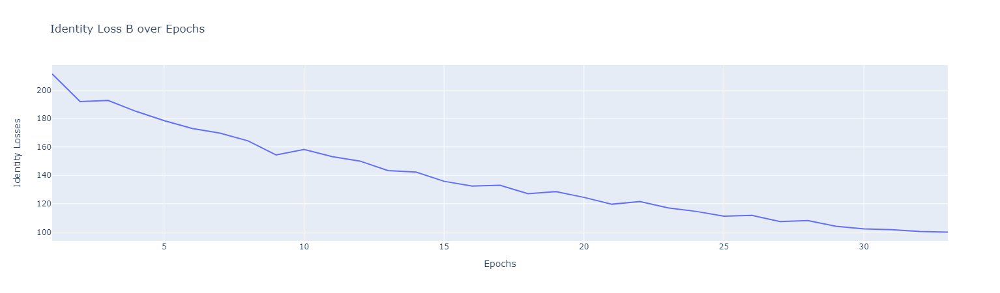

In [21]:
fig = go.Figure()
fig.add_trace(go.Scatter(x=train_counter, y=train_losses_id_B, mode='lines', name='Identity Loss B'))

fig.update_layout(
    title="Identity Loss B over Epochs",
    xaxis_title="Epochs",
    yaxis_title="Identity Losses"),
fig.show()

In [22]:
# Calculate the FID score between the fake and real datasets
!python -m pytorch_fid output/game2movie/real_movie output/game2movie/fake_movie
!python -m pytorch_fid output/game2movie/real_game output/game2movie/fake_game

100%|█████████████████████████████████████████████| 5/5 [00:00<00:00,  5.66it/s]
FID:  116.24121645471894
100%|█████████████████████████████████████████████| 5/5 [00:00<00:00,  5.78it/s]
FID:  133.2165966604195


In [23]:
print("Training time:",str(datetime.timedelta(seconds = int(round(end-start)))))

Training time: 3:11:16


In [24]:
# Generator Layers
print(G_AB)

GeneratorResNet(
  (model): Sequential(
    (0): ReflectionPad2d((3, 3, 3, 3))
    (1): Conv2d(3, 64, kernel_size=(7, 7), stride=(1, 1))
    (2): InstanceNorm2d(64, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (3): ReLU(inplace=True)
    (4): Conv2d(64, 128, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (5): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (6): ReLU(inplace=True)
    (7): Conv2d(128, 256, kernel_size=(3, 3), stride=(2, 2), padding=(1, 1))
    (8): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (9): ReLU(inplace=True)
    (10): ResidualBlock(
      (block): Sequential(
        (0): ReflectionPad2d((1, 1, 1, 1))
        (1): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1))
        (2): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
        (3): ReLU(inplace=True)
        (4): ReflectionPad2d((1, 1, 1, 1))
        

In [25]:
# Generator parameters
params = list(G_AB.parameters())
for p in params:
    print(p.size(),p.requires_grad,p.numel())

torch.Size([64, 3, 7, 7]) True 9408
torch.Size([64]) True 64
torch.Size([128, 64, 3, 3]) True 73728
torch.Size([128]) True 128
torch.Size([256, 128, 3, 3]) True 294912
torch.Size([256]) True 256
torch.Size([256, 256, 3, 3]) True 589824
torch.Size([256]) True 256
torch.Size([256, 256, 3, 3]) True 589824
torch.Size([256]) True 256
torch.Size([256, 256, 3, 3]) True 589824
torch.Size([256]) True 256
torch.Size([256, 256, 3, 3]) True 589824
torch.Size([256]) True 256
torch.Size([256, 256, 3, 3]) True 589824
torch.Size([256]) True 256
torch.Size([256, 256, 3, 3]) True 589824
torch.Size([256]) True 256
torch.Size([256, 256, 3, 3]) True 589824
torch.Size([256]) True 256
torch.Size([256, 256, 3, 3]) True 589824
torch.Size([256]) True 256
torch.Size([256, 256, 3, 3]) True 589824
torch.Size([256]) True 256
torch.Size([256, 256, 3, 3]) True 589824
torch.Size([256]) True 256
torch.Size([256, 256, 3, 3]) True 589824
torch.Size([256]) True 256
torch.Size([256, 256, 3, 3]) True 589824
torch.Size([256]

In [26]:
# Discriminator layers
print(D_A)

Discriminator(
  (model): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (3): InstanceNorm2d(128, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (6): InstanceNorm2d(256, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (9): InstanceNorm2d(512, eps=1e-05, momentum=0.1, affine=False, track_running_stats=False)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): ZeroPad2d(padding=(1, 0, 1, 0), value=0.0)
    (12): Conv2d(512, 1, kernel_size=(4, 4), stride=(1, 1), padding=(1, 1))
  )
)


In [27]:
# Discriminator parameters
params = list(D_A.parameters())
for p in params:
    print(p.size(),p.requires_grad,p.numel())

torch.Size([64, 3, 4, 4]) True 3072
torch.Size([64]) True 64
torch.Size([128, 64, 4, 4]) True 131072
torch.Size([128]) True 128
torch.Size([256, 128, 4, 4]) True 524288
torch.Size([256]) True 256
torch.Size([512, 256, 4, 4]) True 2097152
torch.Size([512]) True 512
torch.Size([1, 512, 4, 4]) True 8192
torch.Size([1]) True 1


['230.png', '82.png', '17.png', '172.png', '146.png', '147.png', '128.png', '83.png', '187.png', '31.png', '61.png', '102.png', '99.png', '3.png', '15.png', '55.png', '110.png', '205.png', '191.png', '155.png', '37.png', '214.png', '108.png', '248.png', '206.png', '1.png', '157.png', '126.png', '24.png', '197.png']



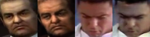
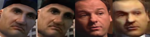
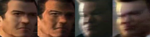
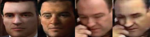
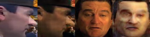
...
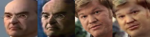
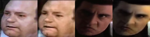
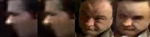
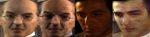
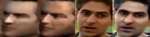

['203.png', '92.png', '30.png', '140.png', '211.png', '192.png', '189.png', '141.png', '78.png', '196.png', '16.png', '138.png', '151.png', '132.png', '25.png', '22.png', '121.png', '119.png', '111.png', '91.png', '115.png', '56.png', '74.png', '182.png', '129.png', '200.png', '20.png', '14.png', '86.png', '106.png']



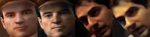
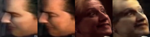
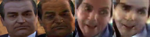
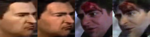
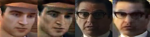
...
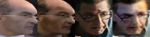
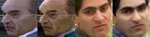
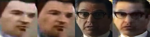
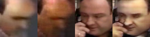
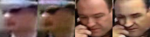

['54.png', '5.png', '201.png', '233.png', '88.png', '170.png', '188.png', '223.png', '241.png', '244.png', '136.png', '66.png', '109.png', '164.png', '226.png', '153.png', '215.png', '212.png', '210.png', '13.png', '231.png', '7.png', '8.png', '11.png', '96.png', '249.png', '60.png', '59.png', '41.png', '84.png']



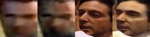
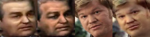
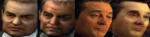
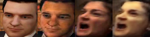
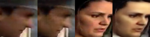
...
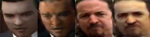
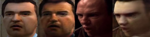
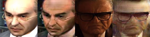
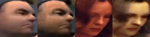
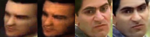

['23.png', '81.png', '228.png', '246.png', '79.png', '27.png', '243.png', '236.png', '33.png', '51.png', '34.png', '217.png', '176.png', '124.png', '216.png', '239.png', '220.png', '95.png', '242.png', '9.png', '208.png', '116.png', '117.png', '194.png', '62.png', '162.png', '167.png', '152.png', '175.png', '26.png']



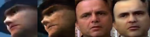
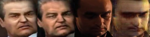
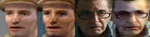
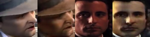
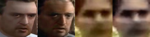
...
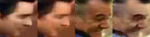
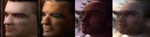
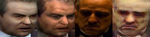
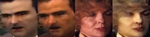
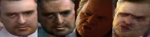

['174.png', '75.png', '47.png', '43.png', '213.png', '35.png', '45.png', '65.png', '125.png', '80.png', '195.png', '222.png', '85.png', '118.png', '161.png', '232.png', '36.png', '143.png', '52.png', '178.png', '19.png', '63.png', '67.png', '154.png', '40.png', '150.png', '98.png', '218.png', '12.png', '89.png']



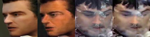
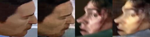
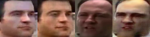
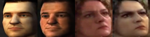
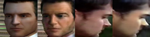
...
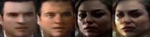
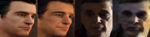
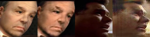
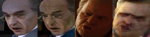
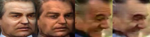

['209.png', '58.png', '227.png', '48.png', '101.png', '173.png', '198.png', '234.png', '139.png', '183.png', '0.png', '112.png', '225.png', '57.png', '49.png', '137.png', '114.png', '105.png', '177.png', '44.png', '207.png', '53.png', '77.png', '186.png', '134.png', '166.png', '69.png', '2.png', '163.png', '199.png']



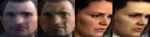
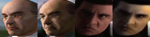
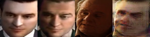
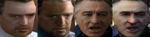
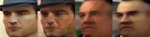
...
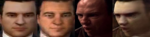
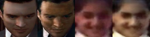
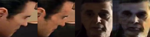
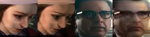
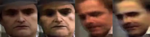

['64.png', '29.png', '160.png', '238.png', '237.png', '94.png', '245.png', '247.png', '130.png', '18.png', '28.png', '50.png', '171.png', '179.png', '122.png', '104.png', '107.png', '73.png', '87.png', '235.png', '4.png', '90.png', '93.png', '193.png', '185.png', '169.png', '42.png', '120.png', '156.png', '6.png']



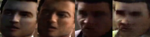
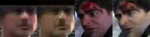
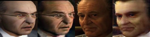
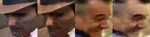
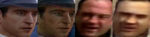
...
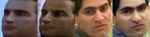
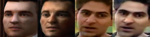
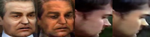
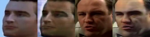
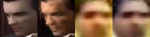

['32.png', '165.png', '149.png', '46.png', '190.png', '158.png', '68.png', '224.png', '100.png', '142.png', '219.png', '240.png', '127.png', '70.png', '159.png', '10.png', '21.png', '113.png', '39.png', '133.png', '221.png', '148.png', '229.png', '204.png', '145.png', '181.png', '131.png', '38.png', '71.png', '202.png']



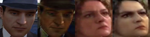
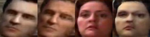
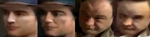
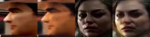
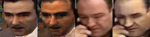
...
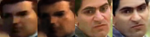
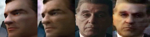
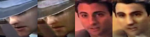
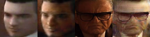
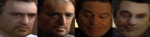

In [28]:
# print output images
out_dir = 'output/game2movie/all/'

res = [f for f in os.listdir(out_dir) if re.search(r'\.png$', f)]
images = []
numbers = []
for f in res:
    numbers.append(f)
    im = np.array(Image.open(out_dir+f))
    images.append(im)

print(numbers[:30])
ipyplot.plot_images(images[:30])
for i in range(30,len(res)-30,30):
    print(numbers[i:i+30])
    ipyplot.plot_images(images[i:i+30])

In [29]:
# Extract game clip
ffmpeg_extract_subclip("MafiaVideogame.mp4", 873, 883, targetname="clip.mp4")

Moviepy - Running:
>>> "+ " ".join(cmd)
Moviepy - Command successful


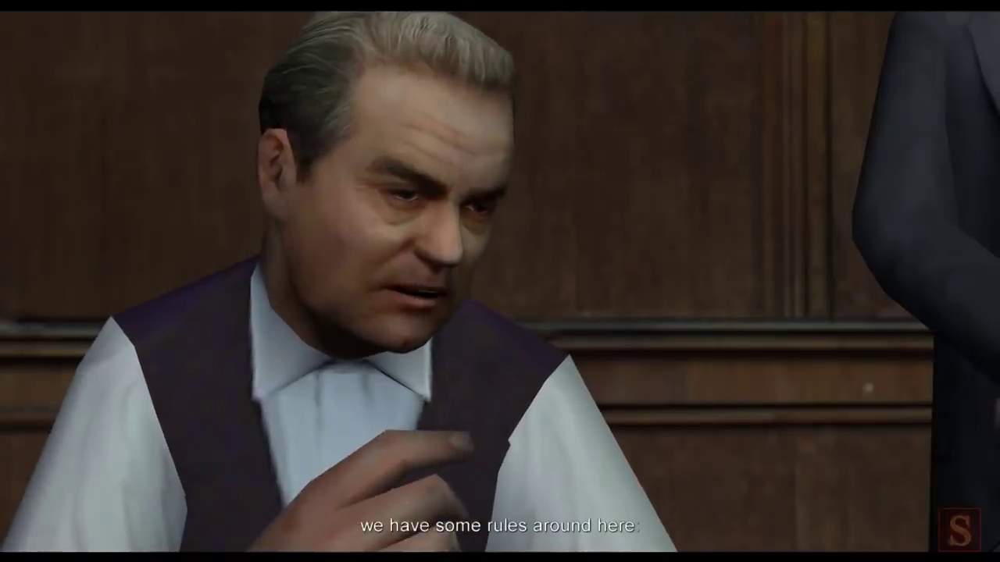

Current frame: 301
Resolution: (1280, 720)
Total frames: 301


In [30]:
# Extract video frames

in_frames = []
d = display.display(None, display_id=True) # setup an empty display to show the video

video = cv2.VideoCapture("clip.mp4") # Using a CV2 function to load the video. The frame is in BGR format.
if (video.isOpened()== False): 
    print("Cannot open video!")

resolution = (int(video.get(cv2.CAP_PROP_FRAME_WIDTH)), int(video.get(cv2.CAP_PROP_FRAME_HEIGHT)))

# Read until video is completed
while(video.isOpened()):
    
    # Get one frame
    ret, in_frame = video.read()
        
    # A valid frame
    if ret == True:
        
        # Data conversion: cv2 operations use a numpy array
        in_frame = np.array(in_frame)
        in_frames.append(in_frame)
        
        # Show a frame once a while (instead of every frame), as this operation is slow
        if (len(in_frames)%10==1):
            in_frame_display = cv2.cvtColor(in_frame, cv2.COLOR_BGR2RGB) # Convert from CV2's BGR to normal RGB for displaying
            d.update(Image.fromarray(in_frame_display)) # Convert the frame from a numpy array back to an image object
        print('\rCurrent frame: {}'.format(len(in_frames)), end='')

    # If the frame is no longer valid
    else: 
        break

# Release the video object memory
video.release()

# Print the video statistics
print("\nResolution: {}".format(resolution))
print ("Total frames: {}".format(len(in_frames)))

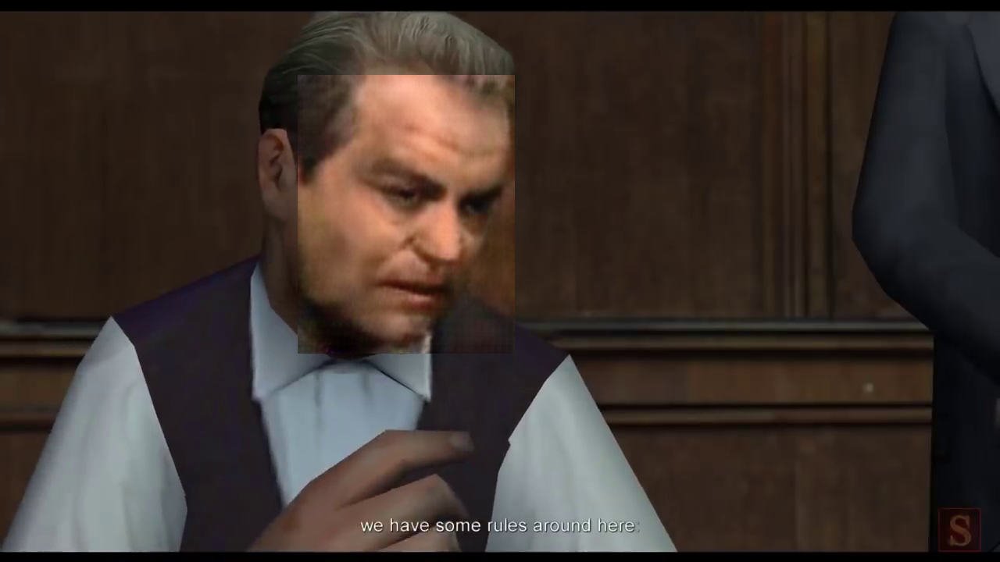

Tracking frame: 301/301
Finished!


In [104]:
out_frames = []
clip_probs = []
d = display.display(None, display_id=True)

# Create MTCNN
mtcnn = MTCNN(device=device, image_size=128, margin=8, keep_all=True)

clip_path = "input/game2movie/clip_faces/"

for i, in_frame in enumerate(in_frames):

        # Detect the faces with MTCNN
        in_frame_process = cv2.cvtColor(in_frame, cv2.COLOR_BGR2RGB) # Convert from CV2's BGR to normal RGB for processing
        boxes, probs = mtcnn.detect(in_frame_process)
        for prob in probs:
            clip_probs.append(prob)

        # Copy the frame
        out_frame = in_frame.copy()
        
        os.makedirs(clip_path, exist_ok=True)
        
        if (boxes is not None):
        
            # Extract and save faces
            faces = mtcnn.extract(in_frame_process, boxes,clip_path+"original/face.jpg")

            # Process faces
            for j in range(len(faces)):
                face = faces[j:j+1]
                real_A = Variable(face.type(Tensor))
                G_AB.eval()
                fake_B = G_AB(real_A)
                save_image(fake_B, f"{clip_path}{j}.png", normalize=True)

            # Add faces back to original frame
            res = [f for f in os.listdir(clip_path) if re.search(r'\.png$', f)]
            res = sorted(res)
            for idx, f in enumerate(res):
                box = boxes[idx]
                width = int(box[2])-int(box[0])+8
                height = int(box[3])-int(box[1])+8
                img = cv2.imread(clip_path+f, cv2.IMREAD_COLOR)
                img = cv2.resize(img,(width,height))
                img = np.array(img)
                out_frame[int(box[1])-4: int(box[3])+4, int(box[0])-4: int(box[2])+4] = img

        shutil.rmtree(clip_path)
        
        # Store the frame
        out_frames.append(out_frame)
        
        # Display a frame once a while
        if (len(out_frames)%10==1):
            out_frame_display = cv2.cvtColor(out_frame, cv2.COLOR_BGR2RGB) # Convert from CV2's BGR to normal RGB for displaying
            d.update(Image.fromarray(out_frame_display))
        print('\rTracking frame: {}/{}'.format((i + 1), len(in_frames)), end='')
        
print('\nFinished!')


In [105]:
# Creating output video

fourcc = cv2.VideoWriter_fourcc(*"FMP4") # FMP4 is the identifiers for the MP4 video compression format
video_tracked = cv2.VideoWriter("OutputVideo.mp4", fourcc, 25.0, resolution)

# Write the detected frames into a video file
for frame in out_frames:
    video_tracked.write(frame)

video_tracked.release()
print("\rFrames written: {}".format(len(out_frames)), end='')

Frames written: 301